# Set up

## Google Drive Set-up

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## Import Libraries

In [ ]:
!pip install -U segmentation-models

In [3]:
import os
import cv2
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
import pandas as pd
import numpy as np
from PIL import Image
import pathlib

from tensorflow.keras.utils import load_img, img_to_array, to_categorical
from tensorflow.python.keras.utils.data_utils import Sequence
from keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import layers
from tensorflow import keras
import tensorflow as tf
from tensorflow.keras import backend as K
import segmentation_models as sm


Segmentation Models: using `keras` framework.


## Useful Functions

In [4]:

# Function to obtain image data generator for image and mask
def data_gen_from_directory(img_path, mask_path, n_classes, batch_size, image_size, augmentation):
  seed = 42
  # Set up the transformation args for ImageDataGenerator
  if augmentation == True:
    img_data_gen_args = dict(horizontal_flip=True,
                            vertical_flip=True,
                            fill_mode='reflect',
                            #brightness_range=[0.9,1.1]
                            )
  else:
    img_data_gen_args = dict()

  image_data_gen = ImageDataGenerator(**img_data_gen_args).flow_from_directory(img_path, 
                                                                               class_mode = None,
                                                                               target_size=image_size,
                                                                               batch_size = batch_size,
                                                                               color_mode='rgb',
                                                                               seed = seed)

  mask_data_gen = ImageDataGenerator(**img_data_gen_args, dtype = tf.int64).flow_from_directory(mask_path, 
                                                                              class_mode = None,
                                                                              target_size=image_size,
                                                                              batch_size = batch_size,
                                                                              color_mode='grayscale', # since its 1 channel mask
                                                                              seed = seed)
  data_generator = zip(image_data_gen, mask_data_gen)
  for (img, mask) in data_generator:
    mask = to_categorical(mask, n_classes) # change to categorical
    yield(img, mask)


# Function to verify if generator is working as expected
def verify_generator(x, y):
  for i in range(20, 24):
      image = x[i].astype(int)
      mask = np.argmax(y[i], axis=2)
      plt.subplot(1,2,1)
      plt.imshow(image)
      plt.subplot(1,2,2)
      plt.imshow(mask)
      plt.title(np.unique(np.argmax(y[i], axis=2), return_counts=True))
      plt.show()

# Functions to calculate IOU and IOU Loss (as loss function)
def jacard_coef(y_true, y_pred):
  y_true_f = K.flatten(y_true)
  y_pred_f = K.flatten(y_pred)
  intersection = K.sum(y_true_f * y_pred_f)
  return (intersection + 1.0) / (K.sum(y_true_f) + K.sum(y_pred_f) - intersection + 1.0)

def jacard_coef_loss(y_true, y_pred):
  return -jacard_coef(y_true, y_pred)  # -1 ultiplied as we want to minimize this value as loss function



# Function to fit model 
def model_fit(model, epoch, model_save_path, logdir, jaccard):

  if jaccard:
    loss = sm.losses.categorical_focal_jaccard_loss
  else:
    loss = "categorical_crossentropy"

  model.compile(optimizer = "adam", loss = loss, metrics=['accuracy', sm.metrics.iou_score])

  callbacks = [
               keras.callbacks.ModelCheckpoint(filepath = model_save_path,
                                               save_best_only = True,
                                               monitor = "val_loss"),
               keras.callbacks.EarlyStopping(
                   patience =8,
                   monitor = "val_loss"),
               keras.callbacks.TensorBoard(
                   log_dir = logdir),
               keras.callbacks.ReduceLROnPlateau(
                   monitor='val_loss',
                   factor=0.1,
                   patience=3,
                   verbose=0,
                   mode='auto',
                   min_delta=0.0001,
                   cooldown=0,
                   min_lr=0
)
  ]

  history = model.fit(
      train_data_gen,
      epochs = epoch,
      steps_per_epoch = num_train_imgs//batch_size,
      validation_steps = num_val_images//batch_size,
      validation_data = val_data_gen,
      callbacks = callbacks
  )
  return model

# Function to visualize image, prediction and true masks
def visualize_prediction(images, predictions, num_show, labels = None, label_present = False):
  if label_present:
    assert images.shape[0] == predictions.shape[0] and images.shape[0] == labels.shape[0]
  else: 
    assert images.shape[0] == predictions.shape[0]
  
  # Make colormap
  # unlablled, building, woodlands, water, road
  colors = [(102, 153, 153), (153, 51, 51), (0, 102, 0), (0, 153, 204), (255, 204, 0)]
  colors = [tuple([num/255 for num in tup]) for tup in colors]
  custom_cmap = LinearSegmentedColormap.from_list('custom', colors, N=5)

  col = 3 if label_present else 2
  fig, axs = plt.subplots(num_show, col, figsize = (20, (num_show)*7))
  for i in range(num_show):
    axs[i][0].imshow(images[i].astype(int))
    axs[i][0].set_xlabel(f"Satellite image")

    predicted_mask = np.argmax(predictions[i], axis=2)
    axs[i][1].imshow(images[i].astype(int))
    axs[i][1].imshow(predicted_mask, vmin = 0, vmax = 4, alpha = 0.5, cmap = custom_cmap)
    #building (1), woodland (2), water(3), road(4)
    label_map = {0:'unlabelled', 1:'building', 2:'woodland', 3:'water', 4: 'road'}
    predicted_labels_txt = [label_map[label] for label in np.unique(predicted_mask)]
    axs[i][1].set_xlabel(f"Predicted: {predicted_labels_txt}")

    if label_present:
      true_mask = np.argmax(labels[i], axis=2)
      axs[i][2].imshow(images[i].astype(int))
      axs[i][2].imshow(true_mask, vmin = 0, vmax = 4, alpha = 0.5, cmap = custom_cmap)
      true_labels_txt = [label_map[label] for label in np.unique(true_mask)]
      axs[i][2].set_xlabel(f"Actual: {true_labels_txt}")

## Import dataset

In [5]:
# Set current working directory to the project folder in gdrive
root_dir = os.getcwd()
project_dir = root_dir + "/drive/My Drive/GA_capstone/"

In [ ]:
# Unzip into working colab memory to speed up reading of dataset

!unzip drive/My\ Drive/GA_capstone/Dataset/256_patches/modeling_dataset_generator.zip

In [7]:
# Defines the path to datasets
#dataset_dir = project_dir + "Dataset/256_patches/modeling_dataset_generator/"
dataset_dir = pathlib.Path("modeling_dataset_generator")

train_img_dir = dataset_dir / "train_images"
train_mask_dir = dataset_dir / "train_masks"
val_img_dir = dataset_dir / "val_images"
val_mask_dir = dataset_dir / "val_masks"
test_img_dir = dataset_dir / "test_images"
test_mask_dir = dataset_dir / "test_masks"

# Model Building

## Model Set up

In [8]:
# Some parameters for model
num_train_imgs = len(os.listdir(train_img_dir / 'train'))
num_val_images = len(os.listdir(val_img_dir / 'val'))

batch_size = 32
n_classes = 5
image_size = (256, 256)

## Base Model

In [9]:
def base_mode(image_size, n_classes):
  inputs = keras.Input(shape = image_size + (3,))
  x = layers.Rescaling(1./255)(inputs)

  x = layers.Conv2D(64, 3, strides = 2, activation = "relu", padding = 'same')(x)
  x = layers.Conv2D(64, 3, activation = "relu", padding = 'same')(x)
  x = layers.Conv2D(128, 3, strides = 2, activation = "relu", padding = 'same')(x)
  x = layers.Conv2D(128, 3, activation = "relu", padding = 'same')(x)
  x = layers.Conv2D(256, 3, strides = 2, activation = "relu", padding = 'same')(x)
  x = layers.Conv2D(256, 3, activation = "relu", padding = 'same')(x)

  x = layers.Conv2DTranspose(256, 3, activation = "relu", padding = 'same')(x)
  x = layers.Conv2DTranspose(256, 3, strides = 2, activation = "relu", padding = 'same')(x)
  x = layers.Conv2DTranspose(128, 3, activation = "relu", padding = 'same')(x)
  x = layers.Conv2DTranspose(128, 3, strides = 2, activation = "relu", padding = 'same')(x)
  x = layers.Conv2DTranspose(64, 3, activation = "relu", padding = 'same')(x)
  x = layers.Conv2DTranspose(64, 3, strides = 2, activation = "relu", padding = 'same')(x)

  outputs = layers.Conv2D(n_classes, 3, activation = 'softmax', padding = "same")(x)

  model = keras.Model(inputs, outputs)
  return model

In [10]:
model = base_mode(image_size = image_size, n_classes = n_classes)
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 rescaling (Rescaling)       (None, 256, 256, 3)       0         
                                                                 
 conv2d (Conv2D)             (None, 128, 128, 64)      1792      
                                                                 
 conv2d_1 (Conv2D)           (None, 128, 128, 64)      36928     
                                                                 
 conv2d_2 (Conv2D)           (None, 64, 64, 128)       73856     
                                                                 
 conv2d_3 (Conv2D)           (None, 64, 64, 128)       147584    
                                                                 
 conv2d_4 (Conv2D)           (None, 32, 32, 256)       295168

### Base model without augmentation

In [11]:
# Since there are about 20,000 images, we will set up image data generator so that the training data can be processed on the fly.
# Get generator for train, validationa and test data
train_data_gen = data_gen_from_directory(train_img_dir, train_mask_dir, n_classes, batch_size = batch_size, image_size = image_size, augmentation = False)
val_data_gen = data_gen_from_directory(val_img_dir, val_mask_dir, n_classes, batch_size = batch_size, image_size = image_size, augmentation = False)
test_data_gen = data_gen_from_directory(test_img_dir, test_mask_dir, n_classes, batch_size = batch_size, image_size = image_size, augmentation = False)

In [ ]:
# Fit model
checkpoint_base_covnet = project_dir + 'models/model_checkpoint/base_covnet.keras' # file location for base covnet

#history_base_model = model_fit(model, epoch = 10, model_save_path = checkpoint_base_covnet, jaccard = False) # fit model

### Base model with augmentation

In [ ]:
# Get generator for train, validationa and test data
train_data_gen = data_gen_from_directory(train_img_dir, train_mask_dir, n_classes,  batch_size = batch_size, image_size = image_size, augmentation = True)
val_data_gen = data_gen_from_directory(val_img_dir, val_mask_dir, n_classes, batch_size = batch_size, image_size = image_size, augmentation = True)
test_data_gen = data_gen_from_directory(test_img_dir, test_mask_dir, n_classes, batch_size = batch_size, image_size = image_size, augmentation = True)

In [ ]:
# Fit model
checkpoint_base_covnet_aug = project_dir + 'models/model_checkpoint/base_covnet_aug.keras' # file location for base covnet with augmentation
log_base_covnet_aug = project_dir + 'logs/base_covnet_aug' # file location for deeper unet

history_base_model_aug = model_fit(model, epoch = 150, model_save_path = checkpoint_base_covnet_aug, logdir = log_base_covnet_aug, jaccard = True) # fit model


Found 34226 images belonging to 1 classes.
Found 34226 images belonging to 1 classes.
Epoch 1/150
1069/1069 [==============================] - ETA: 0s - loss: 0.8492 - accuracy: 0.5875 - iou_score: 0.1882Found 2013 images belonging to 1 classes.
Found 2013 images belonging to 1 classes.
1069/1069 [==============================] - 562s 507ms/step - loss: 0.8492 - accuracy: 0.5875 - iou_score: 0.1882 - val_loss: 0.7081 - val_accuracy: 0.7045 - val_iou_score: 0.3358 - lr: 0.0010
Epoch 2/150
1069/1069 [==============================] - 547s 509ms/step - loss: 0.6479 - accuracy: 0.7167 - iou_score: 0.3959 - val_loss: 0.5980 - val_accuracy: 0.7530 - val_iou_score: 0.4410 - lr: 0.0010
Epoch 3/150
1069/1069 [==============================] - 542s 507ms/step - loss: 0.5590 - accuracy: 0.7690 - iou_score: 0.4801 - val_loss: 0.5305 - val_accuracy: 0.7780 - val_iou_score: 0.5052 - lr: 0.0010
Epoch 4/150
1069/1069 [==============================] - 541s 506ms/step - loss: 0.5116 - accuracy: 0.7962

## Deeper Base

In [12]:
def deep_base_mode(image_size, n_classes):
  inputs = keras.Input(shape = image_size + (3,))
  x = layers.Rescaling(1./255)(inputs)

  x = layers.Conv2D(16, 3, strides = 2, activation = "relu", padding = 'same')(x)
  x = layers.Conv2D(16, 3, activation = "relu", padding = 'same')(x)
  x = layers.Conv2D(32, 3, strides = 2, activation = "relu", padding = 'same')(x)
  x = layers.Conv2D(32, 3, activation = "relu", padding = 'same')(x)
  x = layers.Conv2D(64, 3, strides = 2, activation = "relu", padding = 'same')(x)
  x = layers.Conv2D(64, 3, activation = "relu", padding = 'same')(x)
  x = layers.Conv2D(128, 3, strides = 2, activation = "relu", padding = 'same')(x)
  x = layers.Conv2D(128, 3, activation = "relu", padding = 'same')(x)
  x = layers.Conv2D(256, 3, strides = 2, activation = "relu", padding = 'same')(x)
  x = layers.Conv2D(256, 3, activation = "relu", padding = 'same')(x)

  x = layers.Conv2DTranspose(256, 3, activation = "relu", padding = 'same')(x)
  x = layers.Conv2DTranspose(256, 3, strides = 2, activation = "relu", padding = 'same')(x)
  x = layers.Conv2DTranspose(128, 3, activation = "relu", padding = 'same')(x)
  x = layers.Conv2DTranspose(128, 3, strides = 2, activation = "relu", padding = 'same')(x)
  x = layers.Conv2DTranspose(64, 3, activation = "relu", padding = 'same')(x)
  x = layers.Conv2DTranspose(64, 3, strides = 2, activation = "relu", padding = 'same')(x)
  x = layers.Conv2DTranspose(32, 3, activation = "relu", padding = 'same')(x)
  x = layers.Conv2DTranspose(32, 3, strides = 2, activation = "relu", padding = 'same')(x)
  x = layers.Conv2DTranspose(16, 3, activation = "relu", padding = 'same')(x)
  x = layers.Conv2DTranspose(16, 3, strides = 2, activation = "relu", padding = 'same')(x)

  outputs = layers.Conv2D(n_classes, 3, activation = 'softmax', padding = "same")(x)

  model = keras.Model(inputs, outputs)
  return model

In [13]:
model = deep_base_mode(image_size = image_size, n_classes = n_classes)
model.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 rescaling_1 (Rescaling)     (None, 256, 256, 3)       0         
                                                                 
 conv2d_7 (Conv2D)           (None, 128, 128, 16)      448       
                                                                 
 conv2d_8 (Conv2D)           (None, 128, 128, 16)      2320      
                                                                 
 conv2d_9 (Conv2D)           (None, 64, 64, 32)        4640      
                                                                 
 conv2d_10 (Conv2D)          (None, 64, 64, 32)        9248      
                                                                 
 conv2d_11 (Conv2D)          (None, 32, 32, 64)        1849

In [ ]:
# Get generator for train, validationa and test data
train_data_gen = data_gen_from_directory(train_img_dir, train_mask_dir, n_classes,  batch_size = batch_size, image_size = image_size, augmentation = True)
val_data_gen = data_gen_from_directory(val_img_dir, val_mask_dir, n_classes, batch_size = batch_size, image_size = image_size, augmentation = True)
test_data_gen = data_gen_from_directory(test_img_dir, test_mask_dir, n_classes, batch_size = batch_size, image_size = image_size, augmentation = True)

In [14]:
# Fit model
checkpoint_deeper_base_covnet_aug = project_dir + 'models/model_checkpoint/deeper_base_covnet_aug.keras' # file location for base covnet with augmentation

#history_base_model_aug = model_fit(model, epoch = 10, model_save_path = checkpoint_deeper_base_covnet_aug) # fit model

## Unet

In [11]:
# Keras implementation for Unet
def u_net(image_size, n_classes):
  inputs = keras.Input(shape = image_size + (3,))
  x = layers.Rescaling(1./255)(inputs)

  # Downsample
  c1 = layers.Conv2D(16, 3, activation = 'relu', kernel_initializer= 'he_normal', padding = 'same')(x)
  c1 = layers.Dropout(0.2)(c1)
  c1 = layers.Conv2D(16, 3, activation = 'relu', kernel_initializer = 'he_normal', padding = 'same')(c1)
  p1 = layers.MaxPooling2D((2,2))(c1)

  c2 = layers.Conv2D(32, 3, activation = 'relu', kernel_initializer= 'he_normal', padding = 'same')(p1)
  c2 = layers.Dropout(0.2)(c2)
  c2 = layers.Conv2D(32, 3, activation = 'relu', kernel_initializer = 'he_normal', padding = 'same')(c2)
  p2 = layers.MaxPooling2D((2,2))(c2)

  c3 = layers.Conv2D(64, 3, activation = 'relu', kernel_initializer= 'he_normal', padding = 'same')(p2)
  c3 = layers.Dropout(0.2)(c3)
  c3 = layers.Conv2D(64, 3, activation = 'relu', kernel_initializer = 'he_normal', padding = 'same')(c3)
  p3 = layers.MaxPooling2D((2,2))(c3)

  c4 = layers.Conv2D(128, 3, activation = 'relu', kernel_initializer= 'he_normal', padding = 'same')(p3)
  c4 = layers.Dropout(0.2)(c4)
  c4 = layers.Conv2D(128, 3, activation = 'relu', kernel_initializer = 'he_normal', padding = 'same')(c4) # (16, 16, 128)
  p4 = layers.MaxPooling2D((2,2))(c4)

  c5 = layers.Conv2D(256, 3, activation = 'relu', kernel_initializer= 'he_normal', padding = 'same')(p4)
  c5 = layers.Dropout(0.2)(c5)
  c5 = layers.Conv2D(256, 3, activation = 'relu', kernel_initializer = 'he_normal', padding = 'same')(c5) # (8,8,256)

  # Upsample
  t6 = layers.Conv2DTranspose(128, 2, strides = (2,2), activation = 'relu', padding = 'same')(c5) # (16, 16, 128) 
  t6 = layers.concatenate([t6, c4]) # (16, 16, 256)
  c6 = layers.Conv2D(128, 3, activation = 'relu', kernel_initializer = 'he_normal', padding = 'same')(t6)
  c6 = layers.Dropout(0.2)(c6)
  c6 = layers.Conv2D(128, 3, activation = 'relu', kernel_initializer = 'he_normal', padding = 'same')(c6) # (16, 16, 128)
  
  t7 = layers.Conv2DTranspose(64, 2, strides = (2,2), activation = 'relu', padding = 'same')(c6) # (32, 32, 64) 
  t7 = layers.concatenate([t7, c3]) # (16, 16, 256)
  c7 = layers.Conv2D(64, 3, activation = 'relu', kernel_initializer = 'he_normal', padding = 'same')(t7)
  c7 = layers.Dropout(0.2)(c7)
  c7 = layers.Conv2D(64, 3, activation = 'relu', kernel_initializer = 'he_normal', padding = 'same')(c7) # (32, 32, 64)

  t8 = layers.Conv2DTranspose(32, 2, strides = (2,2), activation = 'relu', padding = 'same')(c7) # (32, 32, 64) 
  t8 = layers.concatenate([t8, c2]) # (16, 16, 256)
  c8 = layers.Conv2D(32, 3, activation = 'relu', kernel_initializer = 'he_normal', padding = 'same')(t8)
  c8 = layers.Dropout(0.2)(c8)
  c8 = layers.Conv2D(32, 3, activation = 'relu', kernel_initializer = 'he_normal', padding = 'same')(c8) # (32, 32, 64)

  t9 = layers.Conv2DTranspose(16, 2, strides = (2,2), activation = 'relu', padding = 'same')(c8) # (32, 32, 64) 
  t9 = layers.concatenate([t9, c1]) # (16, 16, 256)
  c9 = layers.Conv2D(16, 3, activation = 'relu', kernel_initializer = 'he_normal', padding = 'same')(t9)
  c9 = layers.Dropout(0.2)(c9)
  c9 = layers.Conv2D(16, 3, activation = 'relu', kernel_initializer = 'he_normal', padding = 'same')(c9) # (32, 32, 64)

  outputs = layers.Conv2D(n_classes, (1, 1), activation='softmax')(c9)
  
  model = keras.Model(inputs, outputs)
  return model



In [12]:
model = u_net(image_size = image_size, n_classes = n_classes)
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 rescaling (Rescaling)          (None, 256, 256, 3)  0           ['input_1[0][0]']                
                                                                                                  
 conv2d (Conv2D)                (None, 256, 256, 16  448         ['rescaling[0][0]']              
                                )                                                                 
                                                                                              

In [13]:
# Get generator for train, validationa and test data
train_data_gen = data_gen_from_directory(train_img_dir, train_mask_dir, n_classes,  batch_size = batch_size, image_size = image_size, augmentation = True)
val_data_gen = data_gen_from_directory(val_img_dir, val_mask_dir, n_classes, batch_size = batch_size, image_size = image_size, augmentation = True)
test_data_gen = data_gen_from_directory(test_img_dir, test_mask_dir, n_classes, batch_size = batch_size, image_size = image_size, augmentation = True)

In [14]:
# Fit model
checkpoint_unet = project_dir + 'models/model_checkpoint/unet_1.keras' # file location for unet
log_unet = project_dir + 'logs/unet_1' # file location for unet

history_unet_model = model_fit(model, epoch = 150, model_save_path = checkpoint_unet, logdir = log_unet, jaccard = True) # fit model

Found 34226 images belonging to 1 classes.
Found 34226 images belonging to 1 classes.
Epoch 1/150
1069/1069 [==============================] - ETA: 0s - loss: 0.7831 - accuracy: 0.5959 - iou_score: 0.2581Found 2013 images belonging to 1 classes.
Found 2013 images belonging to 1 classes.
1069/1069 [==============================] - 467s 421ms/step - loss: 0.7831 - accuracy: 0.5959 - iou_score: 0.2581 - val_loss: 0.6335 - val_accuracy: 0.7361 - val_iou_score: 0.4101 - lr: 0.0010
Epoch 2/150
1069/1069 [==============================] - 413s 384ms/step - loss: 0.5764 - accuracy: 0.7646 - iou_score: 0.4663 - val_loss: 0.5151 - val_accuracy: 0.7818 - val_iou_score: 0.5241 - lr: 0.0010
Epoch 3/150
1069/1069 [==============================] - 395s 369ms/step - loss: 0.4917 - accuracy: 0.8050 - iou_score: 0.5461 - val_loss: 0.4925 - val_accuracy: 0.7903 - val_iou_score: 0.5464 - lr: 0.0010
Epoch 4/150
1069/1069 [==============================] - 386s 361ms/step - loss: 0.4601 - accuracy: 0.8187

## Deeper Unet

In [ ]:
# Keras implementation for Unet
def deeper_u_net(image_size, n_classes):
  inputs = keras.Input(shape = image_size + (3,))
  x = layers.Rescaling(1./255)(inputs)

  # Downsample
  c1 = layers.Conv2D(16, 3, activation = 'relu', kernel_initializer= 'he_normal', padding = 'same')(x)
  c1 = layers.Dropout(0.2)(c1)
  c1 = layers.Conv2D(16, 3, activation = 'relu', kernel_initializer = 'he_normal', padding = 'same')(c1)
  p1 = layers.MaxPooling2D((2,2))(c1)

  c2 = layers.Conv2D(32, 3, activation = 'relu', kernel_initializer= 'he_normal', padding = 'same')(p1)
  c2 = layers.Dropout(0.2)(c2)
  c2 = layers.Conv2D(32, 3, activation = 'relu', kernel_initializer = 'he_normal', padding = 'same')(c2)
  p2 = layers.MaxPooling2D((2,2))(c2)

  c3 = layers.Conv2D(64, 3, activation = 'relu', kernel_initializer= 'he_normal', padding = 'same')(p2)
  c3 = layers.Dropout(0.2)(c3)
  c3 = layers.Conv2D(64, 3, activation = 'relu', kernel_initializer = 'he_normal', padding = 'same')(c3)
  p3 = layers.MaxPooling2D((2,2))(c3)

  c4 = layers.Conv2D(128, 3, activation = 'relu', kernel_initializer= 'he_normal', padding = 'same')(p3)
  c4 = layers.Dropout(0.2)(c4)
  c4 = layers.Conv2D(128, 3, activation = 'relu', kernel_initializer = 'he_normal', padding = 'same')(c4) # (16, 16, 128)
  p4 = layers.MaxPooling2D((2,2))(c4)

  c5 = layers.Conv2D(256, 3, activation = 'relu', kernel_initializer= 'he_normal', padding = 'same')(p4)
  c5 = layers.Dropout(0.2)(c5)
  c5 = layers.Conv2D(256, 3, activation = 'relu', kernel_initializer = 'he_normal', padding = 'same')(c5) # (16, 16, 128)
  p5 = layers.MaxPooling2D((2,2))(c5)

  c6 = layers.Conv2D(512, 3, activation = 'relu', kernel_initializer= 'he_normal', padding = 'same')(p5)
  c6 = layers.Dropout(0.2)(c6)
  c6 = layers.Conv2D(512, 3, activation = 'relu', kernel_initializer = 'he_normal', padding = 'same')(c6) # (8,8,256)

  # Upsample
  t7 = layers.Conv2DTranspose(256, 2, strides = (2,2), activation = 'relu', padding = 'same')(c6) # (16, 16, 128) 
  t7 = layers.concatenate([t7, c5]) # (16, 16, 256)
  c7 = layers.Conv2D(256, 3, activation = 'relu', kernel_initializer = 'he_normal', padding = 'same')(t7)
  c7 = layers.Dropout(0.2)(c7)
  c7 = layers.Conv2D(256, 3, activation = 'relu', kernel_initializer = 'he_normal', padding = 'same')(c7) # (16, 16, 128)

  t8 = layers.Conv2DTranspose(128, 2, strides = (2,2), activation = 'relu', padding = 'same')(c7) # (16, 16, 128) 
  t8 = layers.concatenate([t8, c4]) # (16, 16, 256)
  c8 = layers.Conv2D(128, 3, activation = 'relu', kernel_initializer = 'he_normal', padding = 'same')(t8)
  c8 = layers.Dropout(0.2)(c8)
  c8 = layers.Conv2D(128, 3, activation = 'relu', kernel_initializer = 'he_normal', padding = 'same')(c8) # (16, 16, 128)
  
  t9 = layers.Conv2DTranspose(64, 2, strides = (2,2), activation = 'relu', padding = 'same')(c8) # (32, 32, 64) 
  t9 = layers.concatenate([t9, c3]) # (16, 16, 256)
  c9 = layers.Conv2D(64, 3, activation = 'relu', kernel_initializer = 'he_normal', padding = 'same')(t9)
  c9 = layers.Dropout(0.2)(c9)
  c9 = layers.Conv2D(64, 3, activation = 'relu', kernel_initializer = 'he_normal', padding = 'same')(c9) # (32, 32, 64)

  t10 = layers.Conv2DTranspose(32, 2, strides = (2,2), activation = 'relu', padding = 'same')(c9) # (32, 32, 64) 
  t10 = layers.concatenate([t10, c2]) # (16, 16, 256)
  c10 = layers.Conv2D(32, 3, activation = 'relu', kernel_initializer = 'he_normal', padding = 'same')(t10)
  c10 = layers.Dropout(0.2)(c10)
  c10 = layers.Conv2D(32, 3, activation = 'relu', kernel_initializer = 'he_normal', padding = 'same')(c10) # (32, 32, 64)

  t11 = layers.Conv2DTranspose(16, 2, strides = (2,2), activation = 'relu', padding = 'same')(c10) # (32, 32, 64) 
  t11 = layers.concatenate([t11, c1]) # (16, 16, 256)
  c11 = layers.Conv2D(16, 3, activation = 'relu', kernel_initializer = 'he_normal', padding = 'same')(t11)
  c11 = layers.Dropout(0.2)(c11)
  c11 = layers.Conv2D(16, 3, activation = 'relu', kernel_initializer = 'he_normal', padding = 'same')(c11) # (32, 32, 64)

  outputs = layers.Conv2D(n_classes, (1, 1), activation='softmax')(c11)
  
  model = keras.Model(inputs, outputs)
  return model



In [ ]:
model = deeper_u_net(image_size = image_size, n_classes = n_classes)
model.summary()

Model: "model_4"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_5 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 rescaling_4 (Rescaling)        (None, 256, 256, 3)  0           ['input_5[0][0]']                
                                                                                                  
 conv2d_80 (Conv2D)             (None, 256, 256, 16  448         ['rescaling_4[0][0]']            
                                )                                                                 
                                                                                            

In [ ]:
# Get generator for train, validationa and test data
train_data_gen = data_gen_from_directory(train_img_dir, train_mask_dir, n_classes,  batch_size = batch_size, image_size = image_size, augmentation = True)
val_data_gen = data_gen_from_directory(val_img_dir, val_mask_dir, n_classes, batch_size = batch_size, image_size = image_size, augmentation = True)
test_data_gen = data_gen_from_directory(test_img_dir, test_mask_dir, n_classes, batch_size = batch_size, image_size = image_size, augmentation = True)

In [15]:
# Fit model
checkpoint_deeper_unet = project_dir + 'models/model_checkpoint/deeper_unet.keras' # file location for deeper unet
log_deeper_unet = project_dir + 'logs/deeper_unet' # file location for deeper unet

#history_deeper_unet_model = model_fit(model, epoch = 150, model_save_path = checkpoint_deeper_unet, logdir = log_deeper_unet, jaccard = True) # fit model

## Model Evaluation

## Start Tensorboard for Monitoring

In [11]:
%reload_ext tensorboard
%tensorboard --logdir drive/My\ Drive/GA_capstone/logs/unet

Output hidden; open in https://colab.research.google.com to view.

## Prediction

In [39]:
x, y = test_data_gen.__next__()

In [40]:
model = keras.models.load_model(project_dir + 'models/model_checkpoint/unet.keras', compile = False)
prediction_unet = model.predict(x)
prediction_unet.shape

(32, 256, 256, 5)

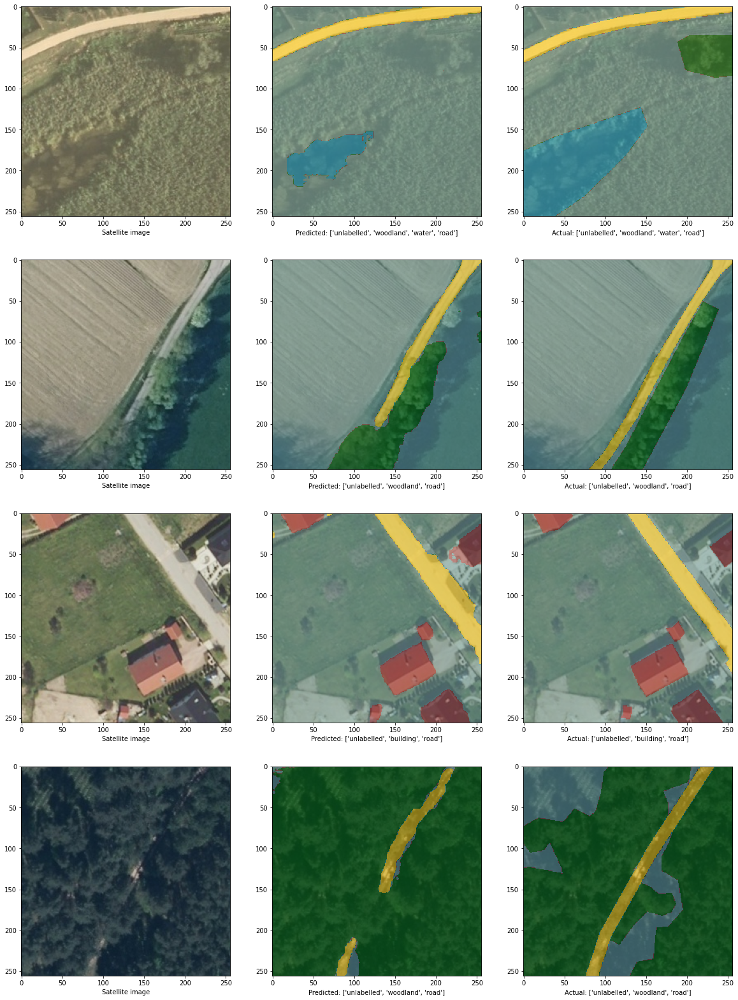

In [41]:
visualize_prediction(x, prediction_unet, labels = y, label_present = True, num_show = 4)

In [42]:
model1 = keras.models.load_model(project_dir + 'models/model_checkpoint/base_covnet_aug.keras', compile = False)
prediction_base = model1.predict(x)
prediction_base.shape

(32, 256, 256, 5)

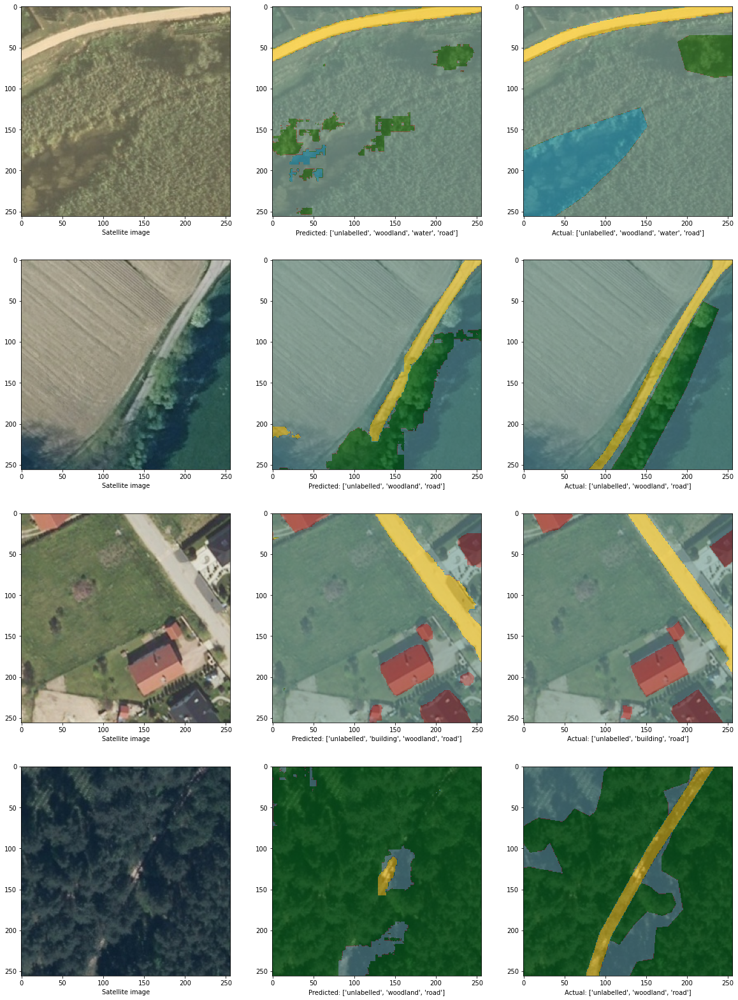

In [43]:
visualize_prediction(x, prediction_base, labels = y, label_present = True, num_show = 4)